In [2]:
import xarray as xr

In [3]:
GESLA_path = "/Users/lb962/Downloads/ESL/GESLA/data/processed/GESLA/filtered_data_1980_to_1981.nc"
GESLA_ds = xr.open_dataset(GESLA_path)

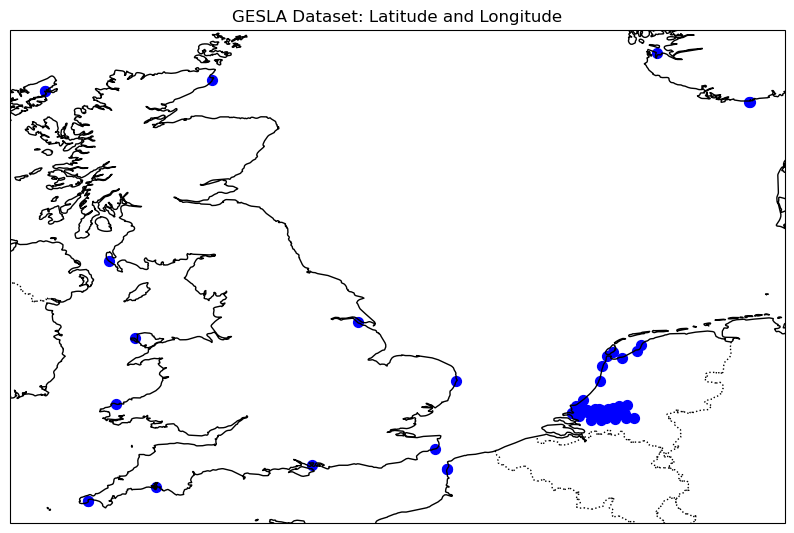

In [5]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy

# Extract latitude and longitude from the GESLA_ds dataset
latitude = GESLA_ds['latitude'].values
longitude = GESLA_ds['longitude'].values

# Create a Cartopy PlateCarree projection
projection = ccrs.PlateCarree()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': projection})

# Plot latitude and longitude
ax.scatter(longitude, latitude, color='blue', s=50)

# Add coastlines and borders
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', linewidth=1)

# Set title and labels
ax.set_title('GESLA Dataset: Latitude and Longitude')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()


In [42]:
era51990 = "/Users/lb962/Downloads/ESL/GESLA/data/ERA5hourly/ERA51990.nc"
era51991 = "/Users/lb962/Downloads/ESL/GESLA/data/ERA5hourly/ERA51991.nc"

era51990_ds = xr.open_dataset(era51990)
era51991_ds = xr.open_dataset(era51991)

In [43]:
import numpy as np

# Extract 'time' variable as numpy array
era51980_ds = era51990_ds
time_values = era51990_ds['time'].values

# Subtract 10 years from each datetime value
adjusted_time = np.datetime64('1980-01-01') + (time_values - np.datetime64('1990-01-01'))

# Assign the adjusted time variable back to the dataset
era51980_ds['time'] = adjusted_time

# Extract 'time' variable as numpy array
era51981_ds = era51991_ds
time_values = era51991_ds['time'].values

# Subtract 10 years from each datetime value
adjusted_time = np.datetime64('1981-01-01') + (time_values - np.datetime64('1991-01-01'))

# Assign the adjusted time variable back to the dataset
era51981_ds['time'] = adjusted_time

In [44]:
era5_ds = xr.concat([era51980_ds, era51981_ds], dim='time')

In [25]:
# Assuming ERA5_dataset is your xarray dataset
coords = era51981_ds['mdts'].coords

In [26]:
# Get a list of unique stations
stations = GESLA_ds['station'].values

# Dictionary to store latitude and longitude coordinates for each station
station_coordinates = {}

# Iterate through each station
for station in stations:
    # Extract latitude and longitude coordinates for the current station
    lat = GESLA_ds.sel(station=station)['latitude'].values.item()
    lon = GESLA_ds.sel(station=station)['longitude'].values.item()
    
    # Store coordinates in the dictionary
    station_coordinates[station] = {'latitude': lat, 'longitude': lon}

In [27]:
# Assuming ERA5_dataset is your xarray dataset
coords = era51981_ds['mdts'].coords

In [28]:
import numpy as np

# Create an empty list to store non-NaN lon, lat combinations
non_nan_lon_lat = []

# Iterate over the latitude and longitude coordinates
for lat, lon in zip(era51981_ds['latitude'].values, era51981_ds['longitude'].values):
    # Check if the mdts value at the current coordinate is not NaN
    if not np.isnan(era51981_ds['mdts'].sel(latitude=lat, longitude=lon).values).any():
        # Append the non-NaN lon, lat combination to the list
        non_nan_lon_lat.append((lat, lon))

In [29]:
import numpy as np

# Define a distance threshold
distance_threshold = 10 # You can adjust this threshold as needed

# Dictionary to store closest coordinates for each station
closest_coordinates = {}

# Iterate over each station in station_coordinates
for station, coords in station_coordinates.items():
    # Extract latitude and longitude from station_coordinates
    lat_station, lon_station = coords['latitude'], coords['longitude']
    
    # Calculate distances between station and all coordinates in era51981_ds
    distances = np.sqrt((lat_station - era51981_ds['latitude'])**2 + 
                        (lon_station - era51981_ds['longitude'])**2)
    
    # Find indices of points within the distance threshold
    close_indices = np.where(distances < distance_threshold)
    
    # Create 2D arrays of latitude and longitude indices
    lon_indices, lat_indices = np.meshgrid(close_indices[1], close_indices[0], indexing='ij')
    
    # Append the close coordinates to the list
    closest_lat_lon = list(zip(era51981_ds['latitude'].values[lat_indices.flatten()], 
                                era51981_ds['longitude'].values[lon_indices.flatten()]))
    
    # Convert the list to a set to remove duplicate coordinates, then back to a list
    closest_lat_lon = list(set(closest_lat_lon))
    
    # Store closest coordinates in the dictionary
    closest_coordinates[station] = closest_lat_lon

In [30]:
# Function to calculate distance between two coordinates
def calculate_distance(coord1, coord2):
    lat1, lon1 = coord1
    lat2, lon2 = coord2
    return np.sqrt((lat2 - lat1)**2 + (lon2 - lon1)**2)


In [31]:
# Initialize a dictionary to store the closest coordinate for each station
closest_stations = {}

# Iterate over each station in closest_coordinates
for station, coordinates in closest_coordinates.items():
    # Get the station's coordinates from station_coordinates
    station_coord = (station_coordinates[station]['latitude'], station_coordinates[station]['longitude'])
    
    # Initialize variables to track the closest distance and station
    min_distance = float('inf')
    closest_station = None
    
    # Iterate over each set of coordinates associated with the station
    for coord in coordinates:
        # Calculate the distance between the station's coordinates and the current coordinate
        distance = calculate_distance(station_coord, coord)
        
        # Check if the current coordinate is in non_nan_lon_lat
        if coord in non_nan_lon_lat:
            closest_station = coord
            break  # Exit the loop if a valid closest station is found
        
        # Update the closest_station and min_distance if the current coordinate is closer
        if distance < min_distance:
            min_distance = distance
            closest_station = coord
    
    # If closest_station is not found in non_nan_lon_lat, find the next closest
    if closest_station not in non_nan_lon_lat:
        # Sort the distances and coordinates based on distances
        sorted_distances = sorted([(calculate_distance(station_coord, coord), coord) for coord in coordinates])
        
        # Iterate through sorted distances and coordinates
        for distance, coord in sorted_distances:
            if coord in non_nan_lon_lat:
                closest_station = coord
                break  # Exit the loop if a valid closest station is found

    else:
        print("ja kurzooi")
        continue
    
    # Store the closest coordinate for the station
    closest_stations[station] = closest_station

ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi
ja kurzooi


In [19]:
closest_stations

{}

In [32]:
# Initialize a dictionary to store the closest coordinate for each station
closest_stations = {}

# Iterate over each station in closest_coordinates
for station, coordinates in closest_coordinates.items():
    # Get the station's coordinates from station_coordinates
    station_coord = (station_coordinates[station]['latitude'], station_coordinates[station]['longitude'])
    
    # Initialize variables to track the closest distance and station
    min_distance = float('inf')
    closest_station = None
    
    # Iterate over each set of coordinates associated with the station
    for coord in coordinates:
        # Calculate the distance between the station's coordinates and the current coordinate
        distance = calculate_distance(station_coord, coord)
        
        # Check if the current coordinate is in non_nan_lon_lat
        if coord in non_nan_lon_lat:
            closest_station = coord
            break  # Exit the loop if a valid closest station is found
        
        # Update the closest_station and min_distance if the current coordinate is closer
        if distance < min_distance:
            min_distance = distance
            closest_station = coord
    
    # If closest_station is not found in non_nan_lon_lat, find the next closest
    if closest_station not in non_nan_lon_lat:
        # Sort the distances and coordinates based on distances
        sorted_distances = sorted([(calculate_distance(station_coord, coord), coord) for coord in coordinates])
        
        # Iterate through sorted distances and coordinates
        for distance, coord in sorted_distances:
            if coord in non_nan_lon_lat:
                closest_station = coord
                print(station)
                print("station found")
                # Store the closest coordinate for the station
                closest_stations[station] = closest_station
                break  # Exit the loop if a valid closest station is found

    else:
        # Store the closest coordinate for the station
        closest_stations[station] = closest_station


print(closest_stations)

{0: (58.0, -4.5), 3: (61.25, -7.75), 5: (58.0, -4.5), 7: (58.0, -4.5), 9: (61.25, -7.75), 11: (61.25, -7.75), 12: (58.0, -4.5), 14: (61.25, -7.75), 15: (61.25, -7.75), 17: (61.25, -7.75), 20: (61.25, -7.75), 65: (58.0, -4.5), 69: (58.0, -4.5), 71: (58.0, -4.5), 73: (58.0, -4.5), 74: (58.0, -4.5), 75: (58.0, -4.5), 76: (58.0, -4.5), 78: (58.0, -4.5), 80: (58.0, -4.5), 82: (58.0, -4.5), 84: (58.0, -4.5), 85: (58.0, -4.5), 86: (58.25, -4.75), 88: (58.5, -5.0), 89: (58.0, -4.5), 90: (58.0, -4.5), 91: (58.0, -4.5), 92: (58.0, -4.5), 93: (58.0, -4.5), 94: (58.0, -4.5), 97: (58.0, -4.5), 99: (58.0, -4.5), 102: (58.0, -4.5), 103: (58.0, -4.5), 104: (58.25, -4.75), 112: (58.5, -5.0), 113: (58.0, -4.5), 114: (58.5, -5.0), 115: (58.0, -4.5), 129: (58.25, -4.75), 137: (58.0, -4.5), 140: (58.0, -4.5), 141: (58.0, -4.5), 147: (58.0, -4.5), 148: (58.0, -4.5), 150: (58.0, -4.5), 151: (58.0, -4.5), 154: (58.0, -4.5), 155: (58.0, -4.5), 157: (58.0, -4.5), 158: (58.0, -4.5), 159: (58.0, -4.5), 226: (58.0

In [46]:
# Initialize a dictionary to store variables for each station
station_data = []

for station, coordinates in closest_stations.items():
    latitude, longitude = coordinates

    # Select data for the specific longitude and latitude
    selected_data = era5_ds.sel(latitude=latitude, longitude=longitude)

    #concatenated_data = xr.concat([selected_data.drop_vars(['latitude', 'longitude']), GESLA_ds.sel(station=station).squeeze().drop_vars(['station']).rename_dims({'date_time': 'time'}).rename({'date_time': 'time'})], dim='time')
    
    # Convert the selected data to a dictionary
    station_data.append(selected_data)

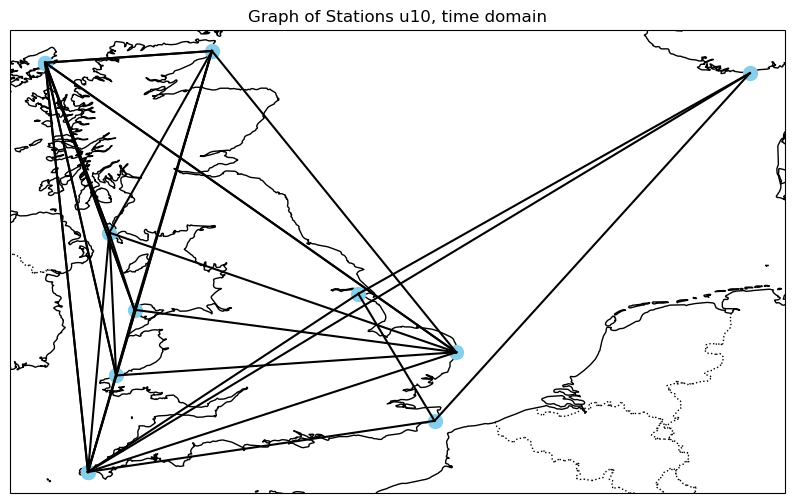

In [34]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import networkx as nx
import cartopy

def plot_station_graph(station_data, station_coordinates, variable, threshold=0.5):
    # Initialize an empty list to store variable values for each station
    variable_values = []

    # Loop through station_data and extract variable values from each station
    for station in station_data:
        variable_values.append(getattr(station, variable))

    # Compute similarity matrix using vectorized operations
    similarity_matrix = np.corrcoef(variable_values)

    # Construct the graph based on the similarity matrix and threshold
    G = nx.Graph()
    num_stations = similarity_matrix.shape[0]

    # Add nodes to the graph
    G.add_nodes_from(range(num_stations))

    # Add edges to the graph based on the similarity matrix and threshold
    for i in range(num_stations):
        for j in range(i + 1, num_stations):
            if similarity_matrix[i, j] > threshold:
                G.add_edge(i, j)

    # Create a Cartopy PlateCarree projection
    projection = ccrs.PlateCarree()

    # Visualize the map
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=projection)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, linestyle=':', linewidth=1)

    for node in G.nodes():
        if node in station_coordinates:
            lat, lon = station_coordinates[node]['latitude'], station_coordinates[node]['longitude']
            ax.plot(lon, lat, 'o', markersize=10, color='skyblue', transform=projection)

    # Plot connections between nodes
    for edge in G.edges():
        node1, node2 = edge
        if node1 in station_coordinates and node2 in station_coordinates:
            lat1, lon1 = station_coordinates[node1]['latitude'], station_coordinates[node1]['longitude']
            lat2, lon2 = station_coordinates[node2]['latitude'], station_coordinates[node2]['longitude']
            ax.plot([lon1, lon2], [lat1, lat2], color='black', transform=projection)

    # Set title and labels
    plt.title(f"Graph of Stations {variable}, time domain")
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show the plot
    plt.show()

# Example usage:
plot_station_graph(station_data, station_coordinates, 'u10', threshold=0.99)

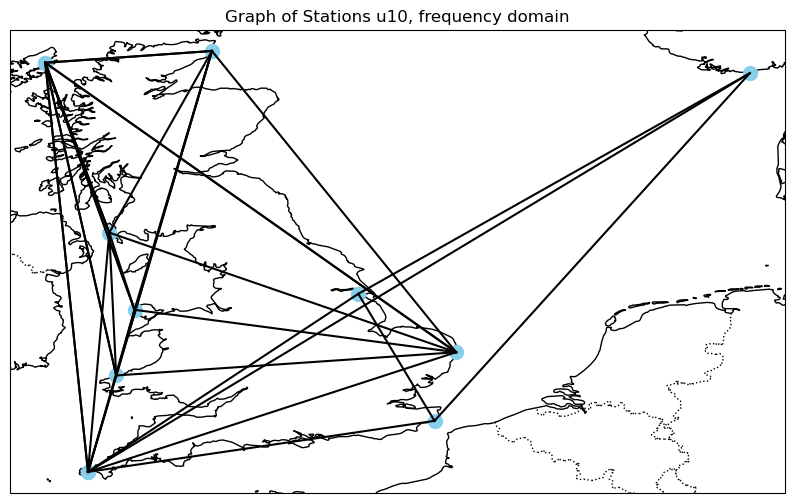

In [365]:
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import networkx as nx
import cartopy

def plot_station_graph_freq(station_data, station_coordinates, variable, threshold=0.5):
    # Initialize an empty list to store variable values for each station
    variable_values = []

    # Loop through station_data and extract variable values from each station
    for station in station_data:
        # Transpose the data to the frequency domain using Fourier transform
        transformed_data = np.fft.fft(getattr(station, variable))
        variable_values.append(transformed_data)

    # Compute similarity matrix using vectorized operations
    similarity_matrix = np.corrcoef(variable_values)

    # Construct the graph based on the similarity matrix and threshold
    G = nx.Graph()
    num_stations = similarity_matrix.shape[0]

    # Add nodes to the graph
    G.add_nodes_from(range(num_stations))

    # Add edges to the graph based on the similarity matrix and threshold
    for i in range(num_stations):
        for j in range(i + 1, num_stations):
            if similarity_matrix[i, j] > threshold:
                G.add_edge(i, j)

    # Create a Cartopy PlateCarree projection
    projection = ccrs.PlateCarree()

    # Visualize the map
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=projection)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, linestyle=':', linewidth=1)

    for node in G.nodes():
        if node in station_coordinates:
            lat, lon = station_coordinates[node]['latitude'], station_coordinates[node]['longitude']
            ax.plot(lon, lat, 'o', markersize=10, color='skyblue', transform=projection)

    # Plot connections between nodes
    for edge in G.edges():
        node1, node2 = edge
        if node1 in station_coordinates and node2 in station_coordinates:
            lat1, lon1 = station_coordinates[node1]['latitude'], station_coordinates[node1]['longitude']
            lat2, lon2 = station_coordinates[node2]['latitude'], station_coordinates[node2]['longitude']
            ax.plot([lon1, lon2], [lat1, lat2], color='black', transform=projection)

    # Set title and labels
    plt.title(f"Graph of Stations {variable}, frequency domain")
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show the plot
    plt.show()

# Example usage:
plot_station_graph_freq(station_data, station_coordinates, 'u10', threshold=0.99)

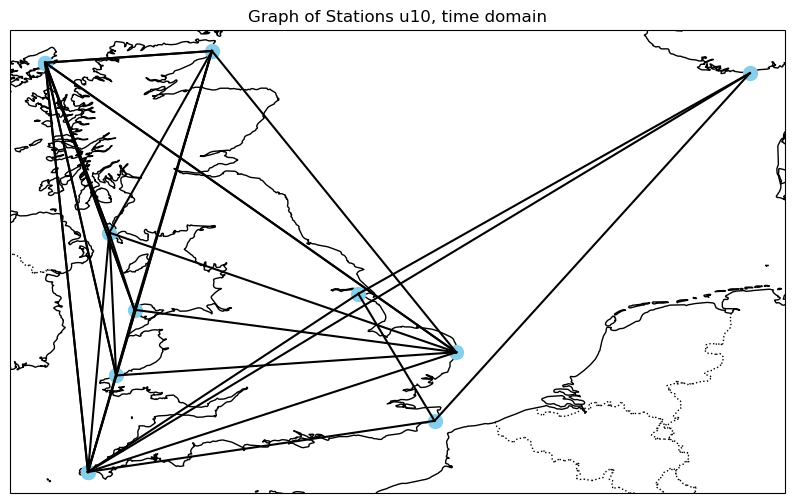

In [367]:
plot_station_graph(station_data, station_coordinates, 'u10', threshold=0.99)

In [51]:
# Mutlivariate
import numpy as np

def plot_station_graph_multi_vars(station_data, station_coordinates, variables, threshold=0.5):
    # Initialize empty lists to store variable values for each station
    variable_values = {var: [] for var in variables}

    # Loop through station_data and extract variable values from each station
    for station in station_data:
        for var in variables:
            variable_values[var].append(getattr(station, var))

    # Compute correlation matrix between the variables
    correlation_matrix = np.corrcoef(np.vstack([variable_values[var] for var in variables]))

    # Construct the graph based on the correlation matrix and threshold
    G = nx.Graph()
    num_variables = correlation_matrix.shape[0]

    # Add nodes to the graph
    G.add_nodes_from(range(num_variables))

    # Add edges to the graph based on the correlation matrix and threshold
    for i in range(num_variables):
        for j in range(i + 1, num_variables):
            if abs(correlation_matrix[i, j]) > threshold:  # Use absolute value for correlation
                G.add_edge(i, j)

    # Create a Cartopy PlateCarree projection
    projection = ccrs.PlateCarree()

    # Visualize the map
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=projection)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, linestyle=':', linewidth=1)

    for node in G.nodes():
        if node in station_coordinates:
            lat, lon = station_coordinates[node]['latitude'], station_coordinates[node]['longitude']
            ax.plot(lon, lat, 'o', markersize=10, color='skyblue', transform=projection)

    # Plot connections between nodes
    for edge in G.edges():
        node1, node2 = edge
        if node1 in station_coordinates and node2 in station_coordinates:
            lat1, lon1 = station_coordinates[node1]['latitude'], station_coordinates[node1]['longitude']
            lat2, lon2 = station_coordinates[node2]['latitude'], station_coordinates[node2]['longitude']
            ax.plot([lon1, lon2], [lat1, lat2], color='black', transform=projection)

    # Set title and labels
    plt.title(f"Graph of Stations {' vs '.join(variables)}, time domain")
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show the plot
    plt.show()

import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import networkx as nx
import cartopy

def plot_station_graph_multi_vars_freq(station_data, station_coordinates, variables, threshold=0.5):
    # Initialize empty lists to store variable values for each station
    variable_values = {var: [] for var in variables}

    # Loop through station_data and extract variable values from each station
    for station in station_data:
        for var in variables:
            # Transpose the data to the frequency domain using Fourier transform
            transformed_data = np.fft.fft(getattr(station, var))
            variable_values[var].append(transformed_data)

    # Compute correlation matrix between the variables
    correlation_matrix = np.corrcoef(np.vstack([variable_values[var] for var in variables]))

    # Construct the graph based on the correlation matrix and threshold
    G = nx.Graph()
    num_variables = correlation_matrix.shape[0]

    # Add nodes to the graph
    G.add_nodes_from(range(num_variables))

    # Add edges to the graph based on the correlation matrix and threshold
    for i in range(num_variables):
        for j in range(i + 1, num_variables):
            if abs(correlation_matrix[i, j]) > threshold:  # Use absolute value for correlation
                G.add_edge(i, j)

    # Create a Cartopy PlateCarree projection
    projection = ccrs.PlateCarree()

    # Visualize the map
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=projection)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, linestyle=':', linewidth=1)

    for node in G.nodes():
        if node in station_coordinates:
            lat, lon = station_coordinates[node]['latitude'], station_coordinates[node]['longitude']
            ax.plot(lon, lat, 'o', markersize=10, color='skyblue', transform=projection)

    # Plot connections between nodes
    for edge in G.edges():
        node1, node2 = edge
        if node1 in station_coordinates and node2 in station_coordinates:
            lat1, lon1 = station_coordinates[node1]['latitude'], station_coordinates[node1]['longitude']
            lat2, lon2 = station_coordinates[node2]['latitude'], station_coordinates[node2]['longitude']
            ax.plot([lon1, lon2], [lat1, lat2], color='black', transform=projection)

    # Set title and labels
    plt.title(f"Graph of Stations {' vs '.join(variables)}, frequency domain")
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show the plot
    plt.show()


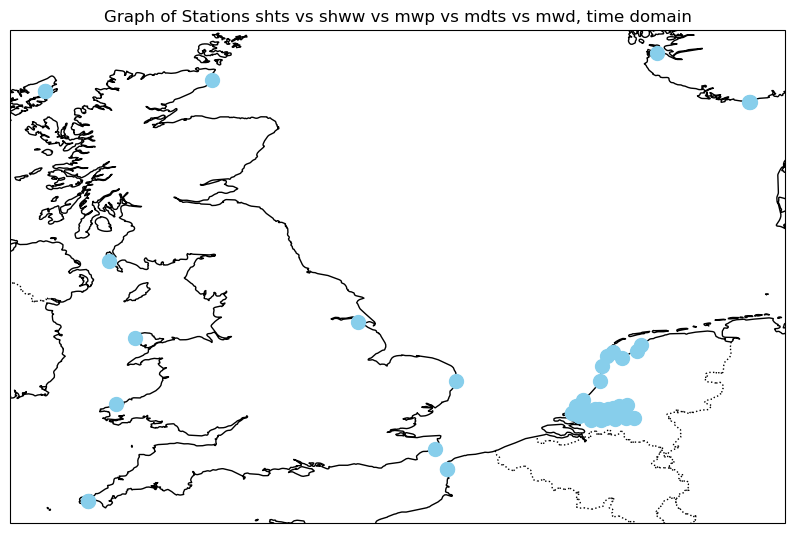

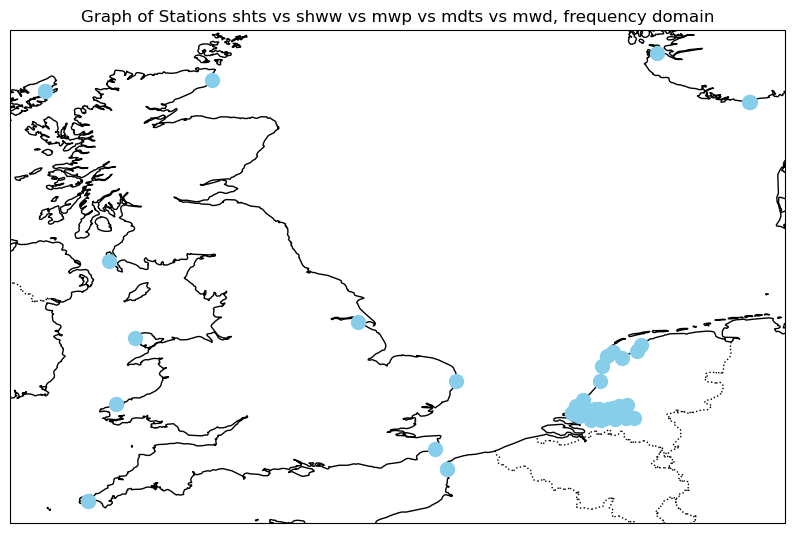

In [52]:
# Example usage:
plot_station_graph_multi_vars(station_data, station_coordinates, ['shts', 'shww', 'mwp', 'mdts', 'mwd'], threshold=0.999)
# Example usage:
plot_station_graph_multi_vars_freq(station_data, station_coordinates, ['shts', 'shww', 'mwp', 'mdts', 'mwd'], threshold=0.999)

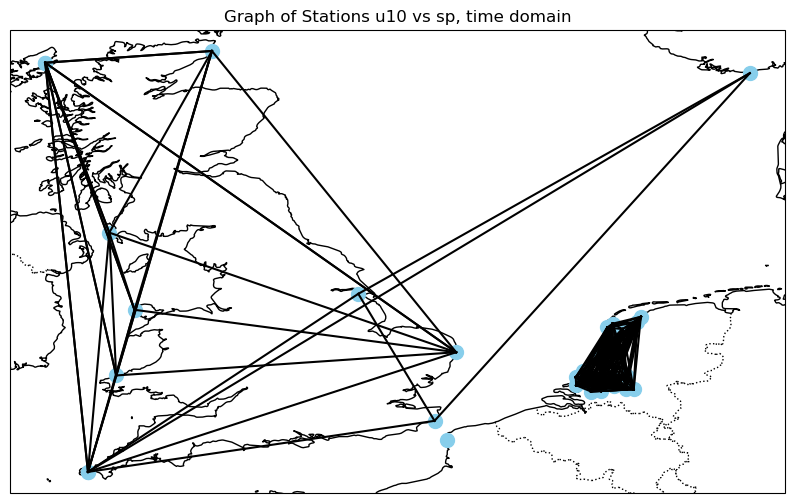

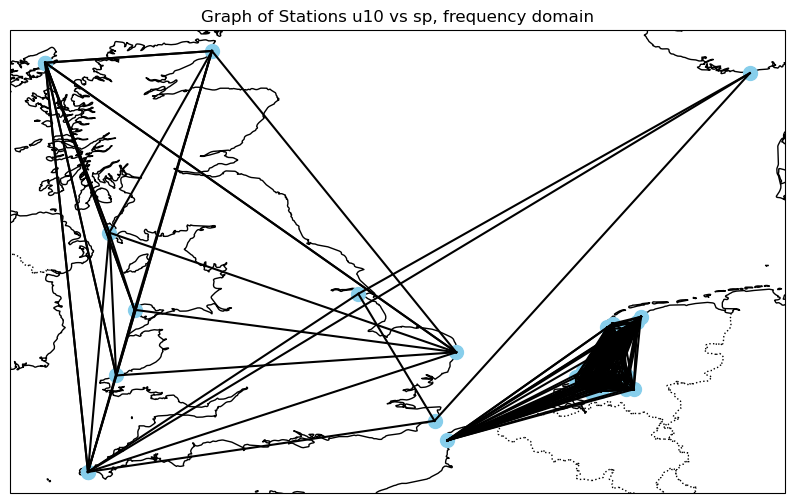

In [376]:
# Example usage:
plot_station_graph_multi_vars(station_data, station_coordinates, ['u10', 'sp'], threshold=0.999)
# Example usage:
plot_station_graph_multi_vars_freq(station_data, station_coordinates, ['u10', 'sp'], threshold=0.999)


# Statistical analysis

In [53]:
# Initialize a dictionary to store variables for each station
station_data = []

for station, coordinates in closest_stations.items():
    latitude, longitude = coordinates

    # Select data for the specific longitude and latitude
    selected_data = era5_ds.sel(latitude=latitude, longitude=longitude)

    #concatenated_data = xr.concat([selected_data.drop_vars(['latitude', 'longitude']), GESLA_ds.sel(station=station).squeeze().drop_vars(['station']).rename_dims({'date_time': 'time'}).rename({'date_time': 'time'})], dim='time')
    merged_data = xr.merge([selected_data.drop_vars(['latitude', 'longitude']), GESLA_ds.sel(station=station).squeeze().drop_vars(['station']).rename_dims({'date_time': 'time'}).rename({'date_time': 'time'})])
    # Convert the selected data to a dictionary
    station_data.append(merged_data)

/var/folders/2b/rpgq1g5d5qz2nhbpj5s4jnrc0000gq/T/ipykernel_92828/353733405.py:11: UserWarning: rename 'date_time' to 'time' does not create an index anymore. Try using swap_dims instead or use set_index after rename to create an indexed coordinate.
  merged_data = xr.merge([selected_data.drop_vars(['latitude', 'longitude']), GESLA_ds.sel(station=station).squeeze().drop_vars(['station']).rename_dims({'date_time': 'time'}).rename({'date_time': 'time'})])


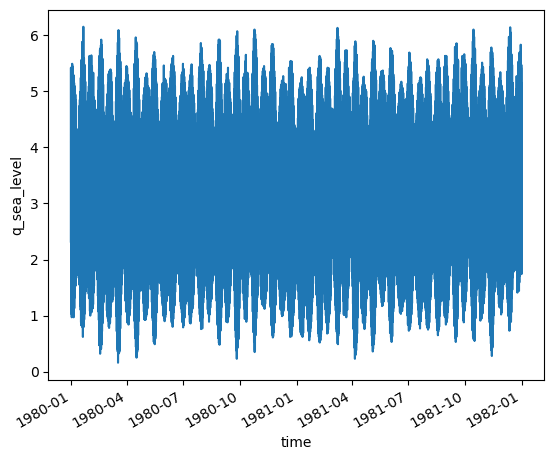

In [49]:
station_data[0].q_sea_level.plot()

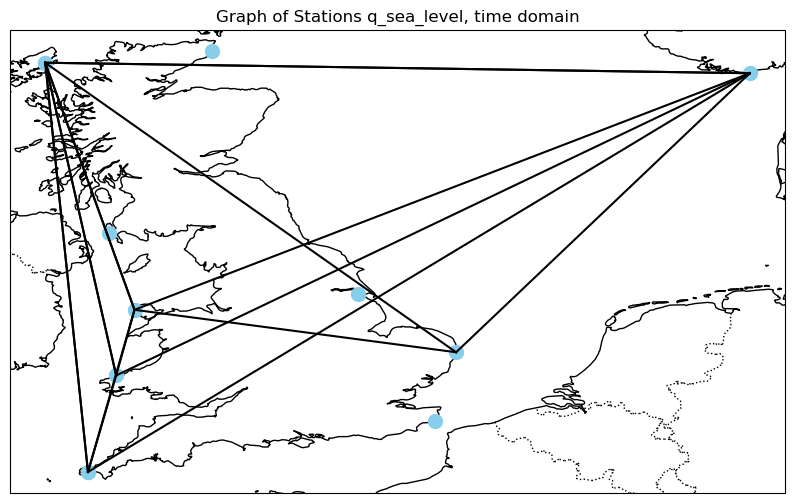

In [55]:
plot_station_graph_multi_vars(station_data, station_coordinates, ['q_sea_level'], threshold=0.1)

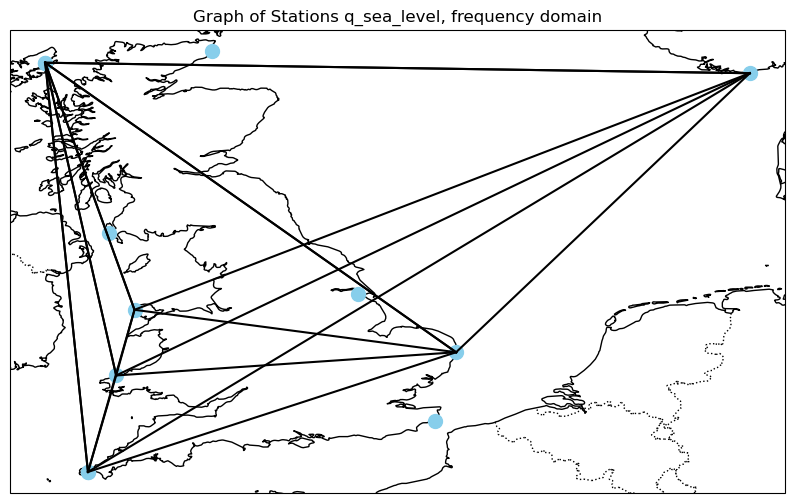

In [56]:
plot_station_graph_multi_vars_freq(station_data, station_coordinates, ['q_sea_level'], threshold=0.1)

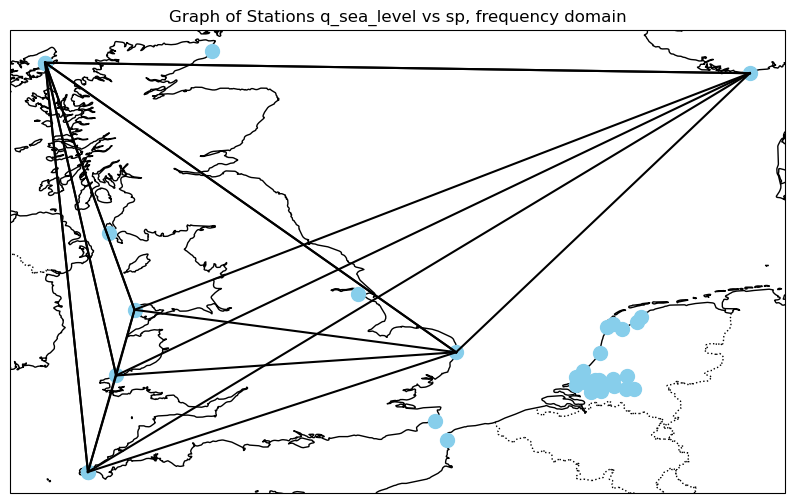

In [57]:
plot_station_graph_multi_vars_freq(station_data, station_coordinates, ['q_sea_level', 'sp'], threshold=0.1)

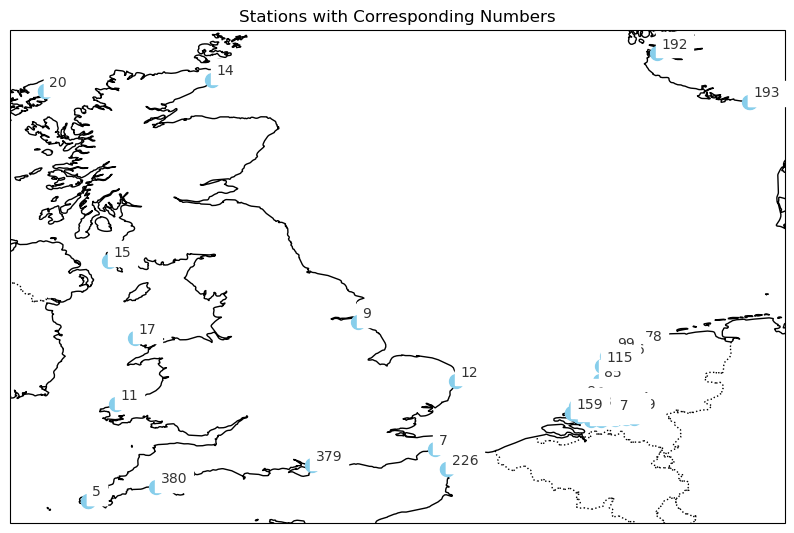

In [70]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create a Cartopy PlateCarree projection
projection = ccrs.PlateCarree()

# Visualize the map
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 1, 1, projection=projection)

# Add coastlines and borders
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=1)

# Plot station coordinates with corresponding numbers
for station_idx, station_coord in station_coordinates.items():
    lon, lat = station_coord['longitude'], station_coord['latitude']
    ax.plot(lon, lat, 'o', markersize=10, color='skyblue', transform=projection)
    
    # Annotate with station number
    ax.annotate(str(station_idx), xy=(lon, lat), xytext=(3, 3), textcoords='offset points',
                color='black', fontsize=10, backgroundcolor='white', alpha=0.8)

# Set title and labels
plt.title("Stations with Corresponding Numbers")
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Show the plot
plt.show()


In [76]:
i = 0
for station_idx, station_coord in station_coordinates.items():
    print(station_idx, i)
    i += 1

0 0
1 1
3 2
5 3
7 4
9 5
11 6
12 7
14 8
15 9
17 10
20 11
65 12
69 13
71 14
73 15
74 16
75 17
76 18
78 19
80 20
82 21
84 22
85 23
86 24
88 25
89 26
90 27
91 28
92 29
93 30
94 31
97 32
99 33
102 34
103 35
104 36
112 37
113 38
114 39
115 40
129 41
137 42
140 43
141 44
147 45
148 46
150 47
151 48
154 49
155 50
157 51
158 52
159 53
192 54
193 55
226 56
379 57
380 58


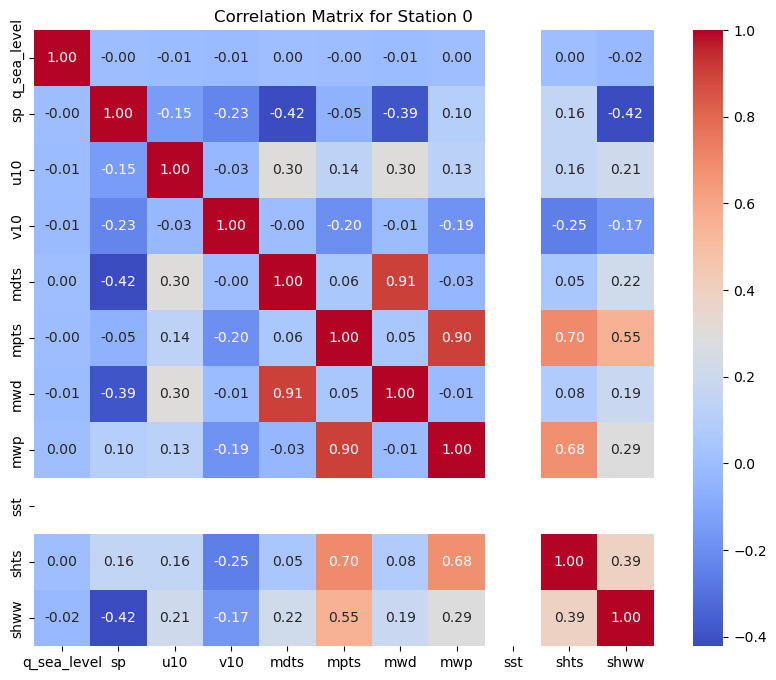

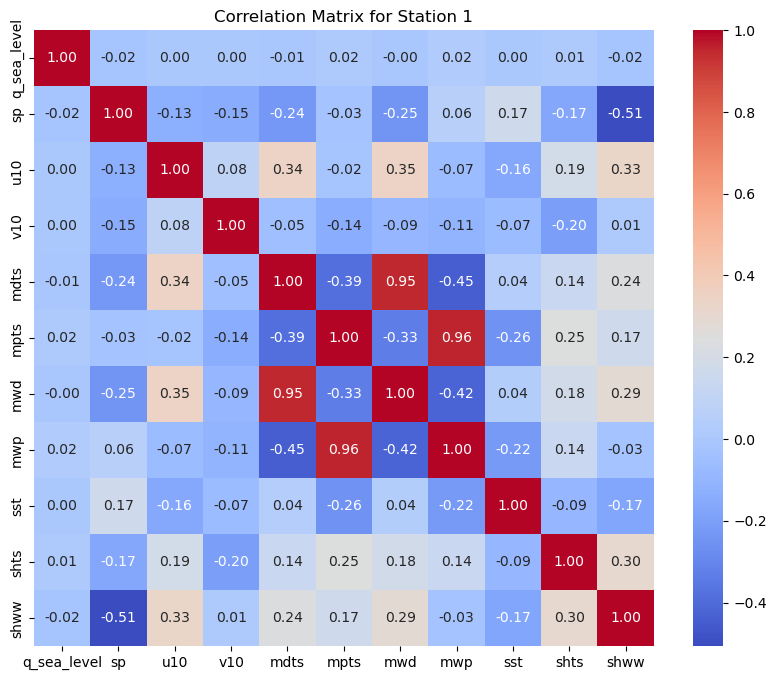

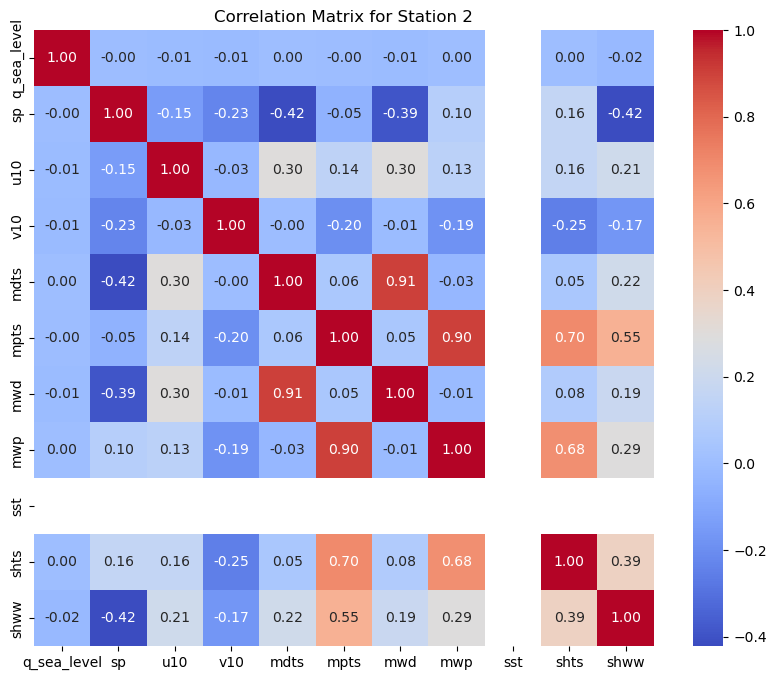

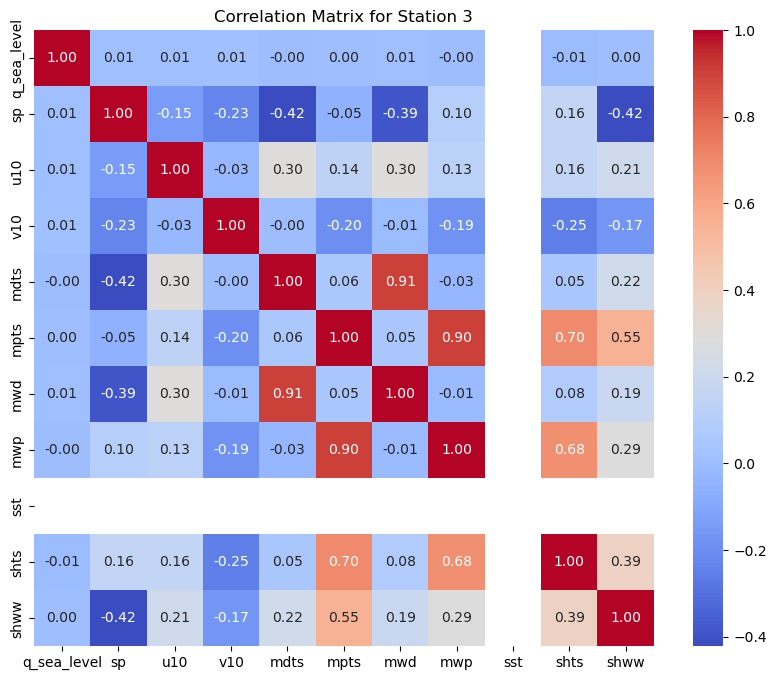

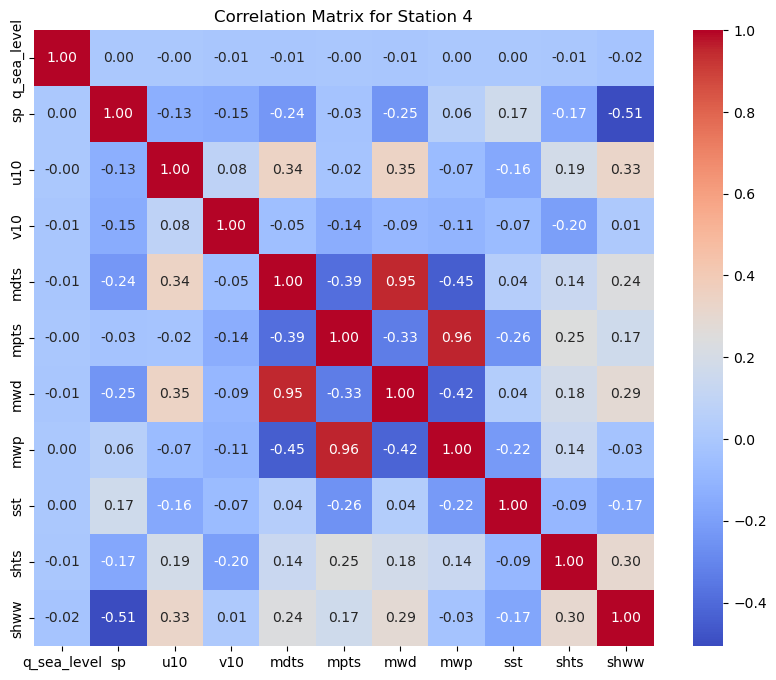

...

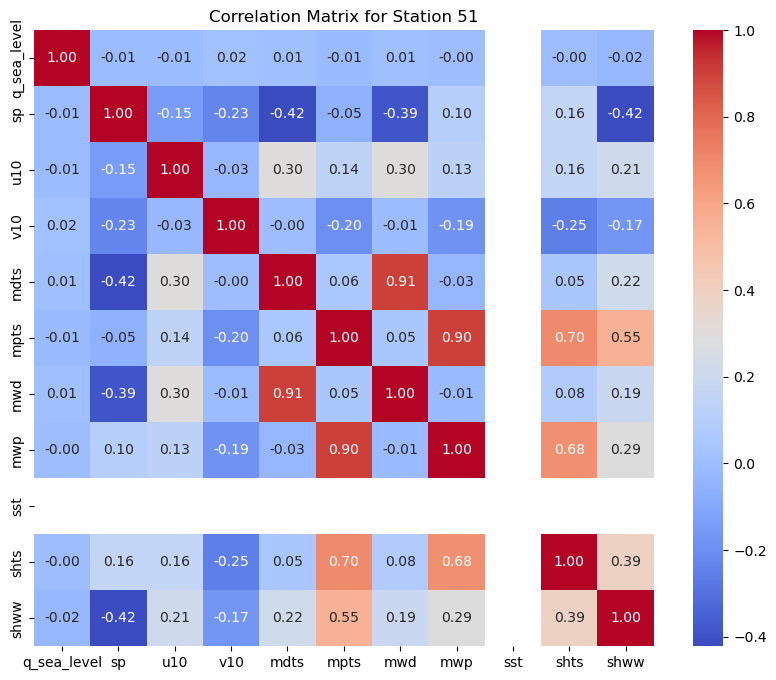

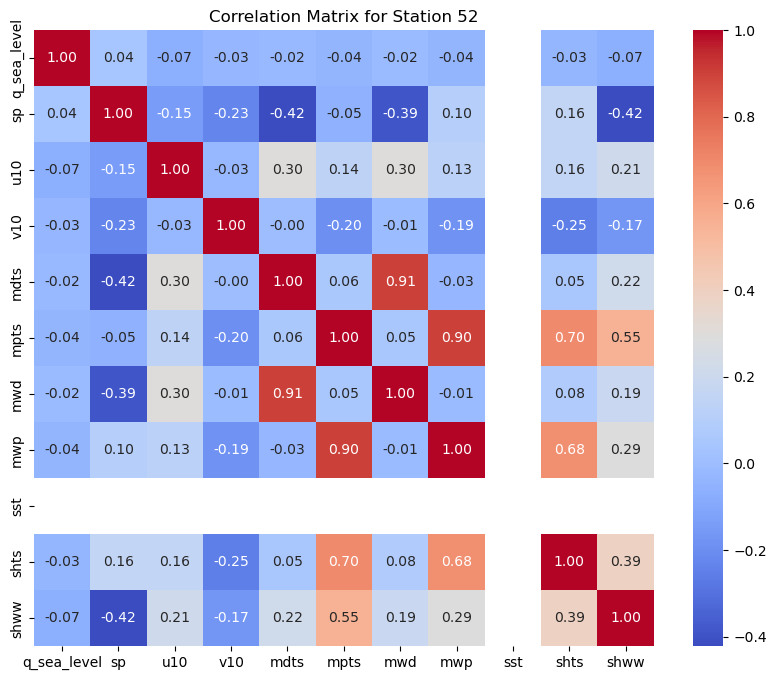

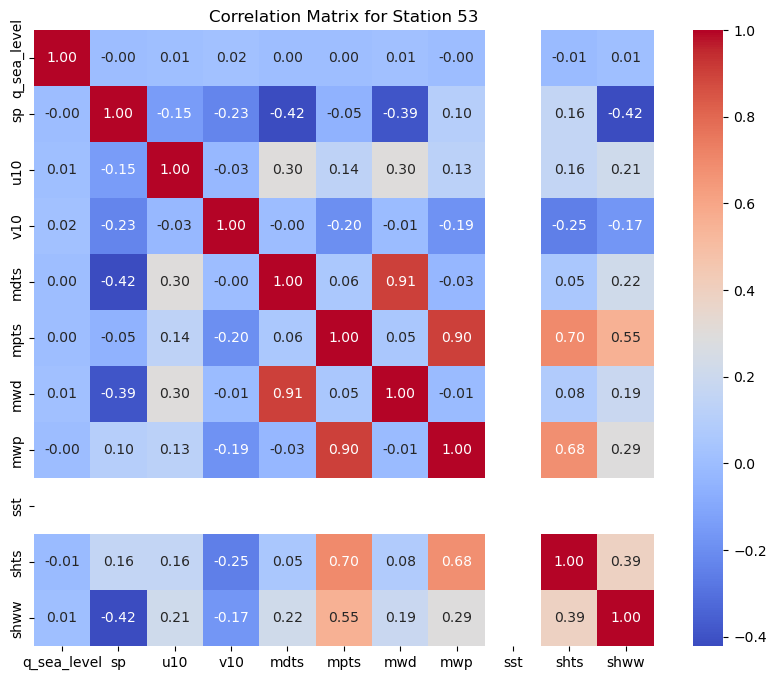

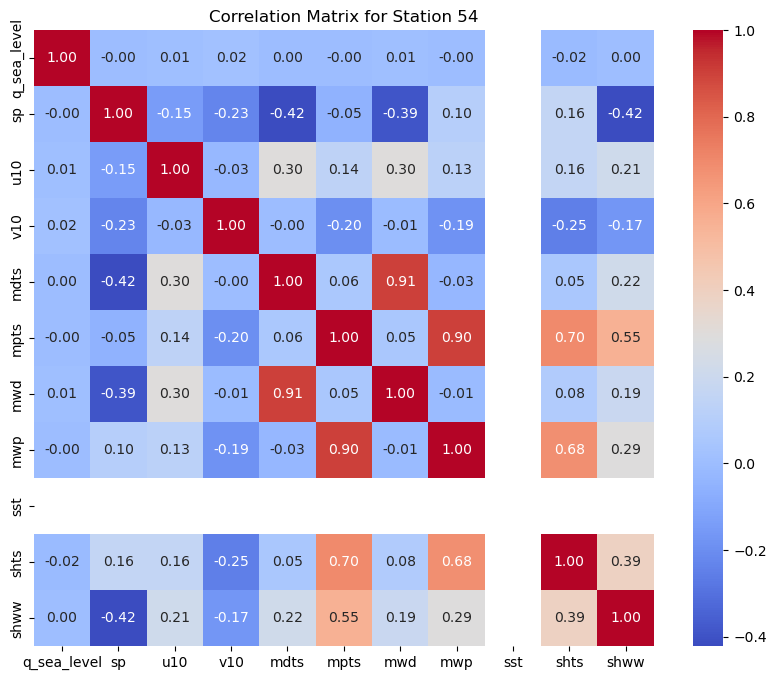

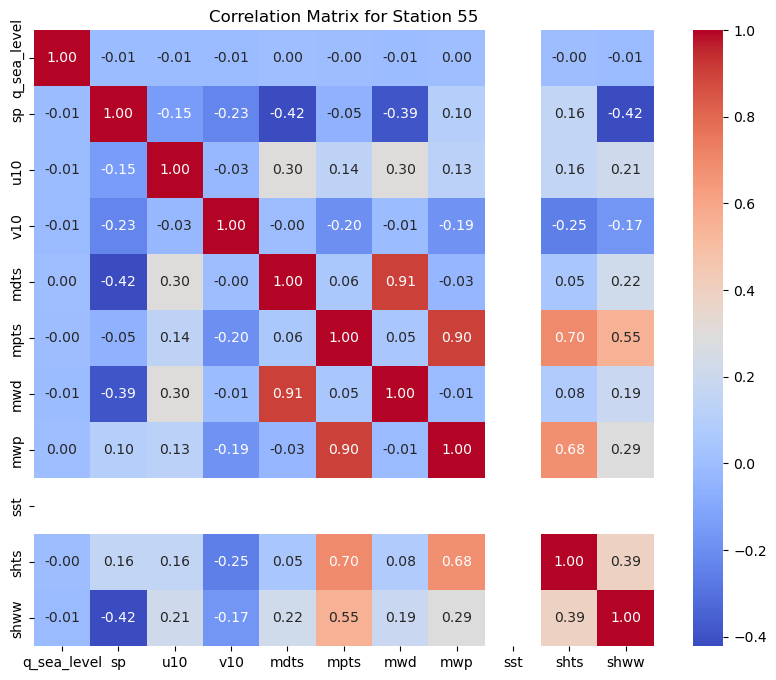

In [73]:
import pandas as pd
import seaborn as sns

# Iterate over each station in station_data
for station_idx, station in enumerate(station_data):
    # Extract the variables for the current station
    variables = ['q_sea_level', 'sp', 'u10', 'v10', 'mdts', 'mpts', 'mwd', 'mwp', 'sst', 'shts', 'shww']
    
    # Extract the data for the current station
    station_data_subset = station_data[station_idx]
    
    # Convert the dataset to a pandas DataFrame
    df = station_data_subset.to_dataframe()
    
    # Select the variables of interest
    df_subset = df[variables]
    
    # Compute the correlation matrix
    correlation_matrix = df_subset.corr()
    
    # Plot the correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f"Correlation Matrix for Station {station_idx}")
    plt.show()


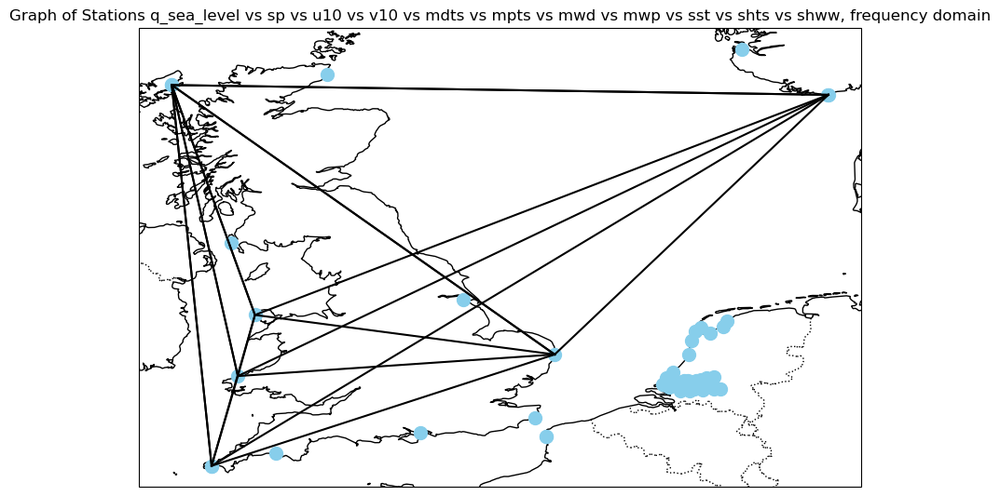

In [63]:
plot_station_graph_multi_vars_freq(station_data, station_coordinates, ['q_sea_level', 'sp', 'u10', 'v10', 'mdts', 'mpts', 'mwd', 'mwp', 'sst', 'shts', 'shww'], threshold=0.1)

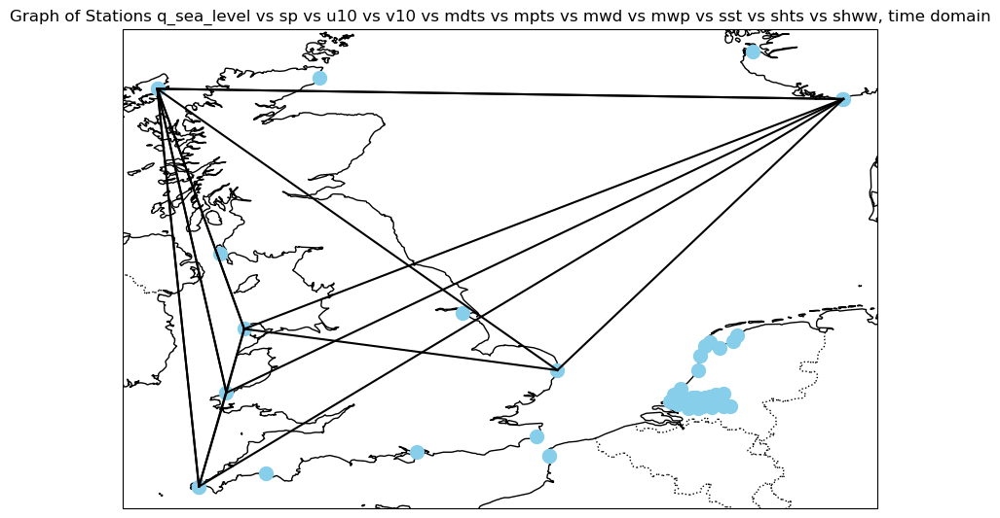

In [62]:
plot_station_graph_multi_vars(station_data, station_coordinates, ['q_sea_level', 'sp', 'u10', 'v10', 'mdts', 'mpts', 'mwd', 'mwp', 'sst', 'shts', 'shww'], threshold=0.1)

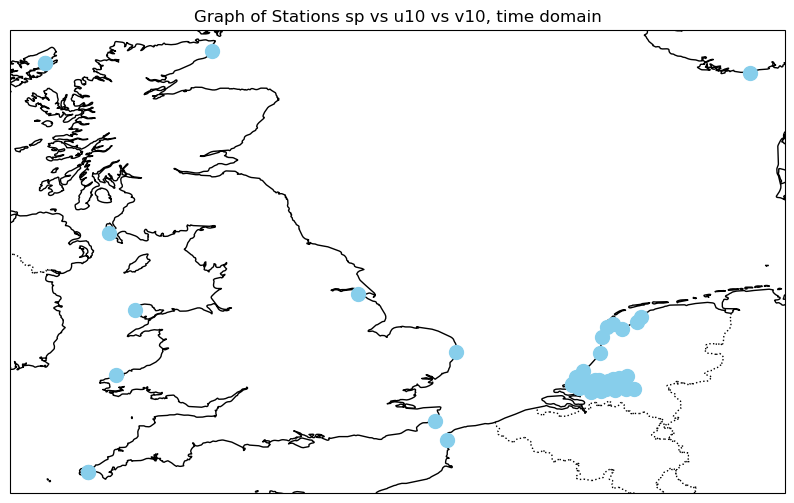

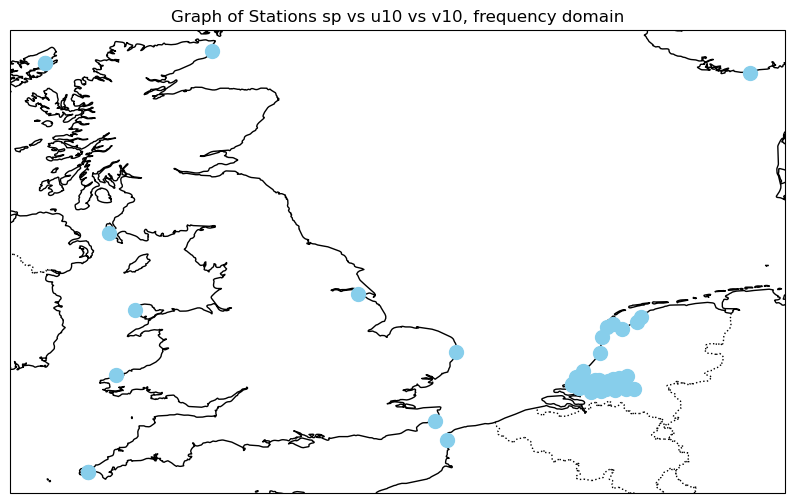

In [78]:
plot_station_graph_multi_vars(station_data, station_coordinates, ['sp', 'u10', 'v10',], threshold=0.1)
plot_station_graph_multi_vars_freq(station_data, station_coordinates, ['sp', 'u10', 'v10'], threshold=0.1)

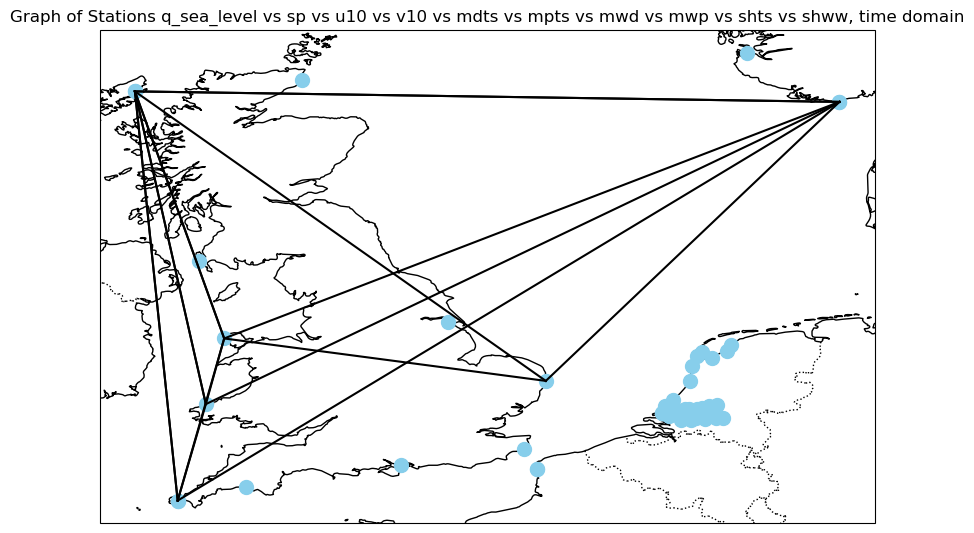

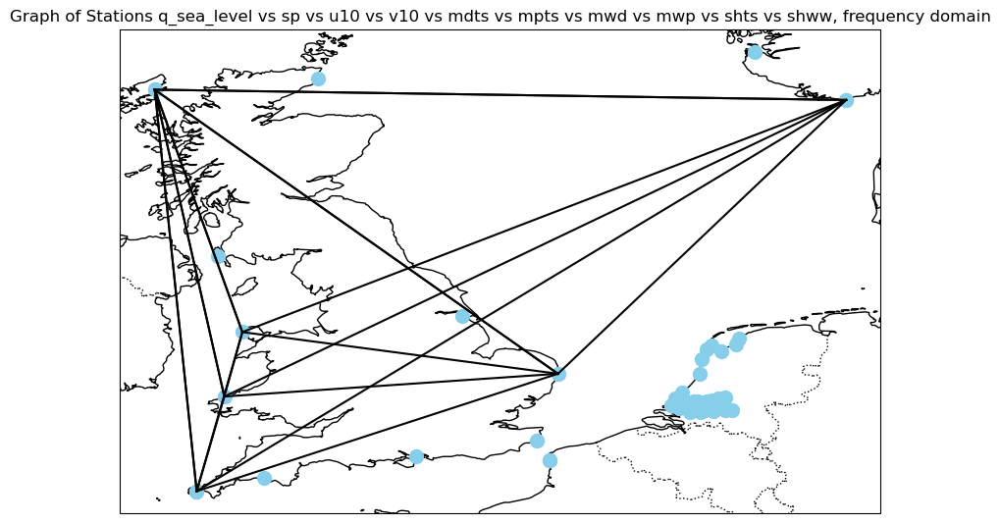

In [69]:
plot_station_graph_multi_vars(station_data, station_coordinates, ['q_sea_level', 'sp', 'u10', 'v10', 'mdts', 'mpts', 'mwd', 'mwp',  'shts', 'shww'], threshold=0.1)
plot_station_graph_multi_vars_freq(station_data, station_coordinates, ['q_sea_level', 'sp', 'u10', 'v10', 'mdts', 'mpts', 'mwd', 'mwp',  'shts', 'shww'], threshold=0.1)

# Old

In [13]:
import numpy as np

# Define a distance threshold
distance_threshold = 0.2 # You can adjust this threshold as needed

# Dictionary to store closest coordinates for each station
closest_coordinates = {}

# Iterate over each station in station_coordinates
for station, coords in station_coordinates.items():
    # Extract latitude and longitude from station_coordinates
    lat_station, lon_station = coords['latitude'], coords['longitude']
    
    # Calculate distances between station and all coordinates in era51981_ds
    distances = np.sqrt((lat_station - era51981_ds['latitude'])**2 + 
                        (lon_station - era51981_ds['longitude'])**2)
    
    # Find indices of points within the distance threshold
    close_indices = np.where(distances < distance_threshold)
    
    # Create 2D arrays of latitude and longitude indices
    lon_indices, lat_indices = np.meshgrid(close_indices[1], close_indices[0], indexing='ij')
    
    # Append the close coordinates to the list
    closest_lat_lon = list(zip(era51981_ds['latitude'].values[lat_indices.flatten()], 
                                era51981_ds['longitude'].values[lon_indices.flatten()]))
    
    # Store closest coordinates in the dictionary
    closest_coordinates[station] = closest_lat_lon

NameError: name 'station_coordinates' is not defined

In [83]:
# Function to calculate distance between two coordinates
def calculate_distance(coord1, coord2):
    lat1, lon1 = coord1
    lat2, lon2 = coord2
    return np.sqrt((lat2 - lat1)**2 + (lon2 - lon1)**2)

# Initialize a dictionary to store the closest coordinate for each station
closest_stations = {}

# Iterate over each station in closest_coordinates
for station, coordinates in closest_coordinates.items():
    # Get the station's coordinates from station_coordinates
    station_coord = (station_coordinates[station]['latitude'], station_coordinates[station]['longitude'])
    
    # Initialize variables to track the closest distance and station
    min_distance = float('inf')
    closest_station = None
    
    # Iterate over each set of coordinates associated with the station
    for coord in coordinates:
        # Calculate the distance between the station's coordinates and the current coordinate
        distance = calculate_distance(station_coord, coord)
        
        # Update the closest_station and min_distance if the current coordinate is closer
        if distance < min_distance:
            min_distance = distance
            closest_station = coord
    
    # Store the closest coordinate for the station
    closest_stations[station] = closest_station
closest_stations

{0: (50.0, -5.5),
 1: (58.0, 7.5),
 3: (58.25, -6.5),
 5: (50.0, -5.5),
 7: (51.0, 1.25),
 9: (53.75, -0.25),
 11: (52.0, -5.0),
 12: (52.5, 1.75),
 14: (58.5, -3.0),
 15: (54.75, -5.0),
 17: (53.25, -4.5),
 20: (58.25, -6.5),
 65: (50.75, 1.5),
 69: (51.75, 5.0),
 71: (51.75, 5.25),
 73: (52.0, 4.0),
 74: (53.0, 5.25),
 75: (53.0, 4.75),
 76: (51.75, 4.25),
 78: (53.25, 5.5),
 80: (52.0, 4.5),
 82: (51.75, 4.75),
 84: (52.0, 4.25),
 85: (52.5, 4.5),
 86: (53.0, 5.0),
 88: (52.0, 4.75),
 89: (51.75, 5.0),
 90: (51.75, 4.5),
 91: (51.75, 4.5),
 92: (51.75, 4.5),
 93: (52.0, 4.25),
 94: (52.0, 4.25),
 97: (51.75, 4.25),
 99: (53.0, 4.75),
 102: (52.0, 4.75),
 103: (52.0, 4.5),
 104: (52.0, 5.25),
 112: (51.75, 5.0),
 113: (51.75, 5.0),
 114: (52.0, 5.0),
 115: (52.75, 4.75),
 129: (51.75, 5.0),
 137: (51.75, 4.75),
 140: (51.75, 4.25),
 141: (52.0, 4.75),
 147: (51.75, 4.0),
 148: (51.75, 5.0),
 150: (51.75, 4.75),
 151: (51.75, 4.75),
 154: (52.0, 4.25),
 155: (51.75, 4.75),
 157: (51.7

In [11]:
era5_ds = xr.concat([era51980_ds, era51981_ds], dim='time')

In [12]:
# Initialize a dictionary to store variables for each station
station_data = []

for station, coordinates in closest_stations.items():
    latitude, longitude = coordinates

    # Select data for the specific longitude and latitude
    selected_data = era5_ds.sel(latitude=latitude, longitude=longitude)

    #concatenated_data = xr.concat([selected_data.drop_vars(['latitude', 'longitude']), GESLA_ds.sel(station=station).squeeze().drop_vars(['station']).rename_dims({'date_time': 'time'}).rename({'date_time': 'time'})], dim='time')
    
    # Convert the selected data to a dictionary
    station_data.append(selected_data)

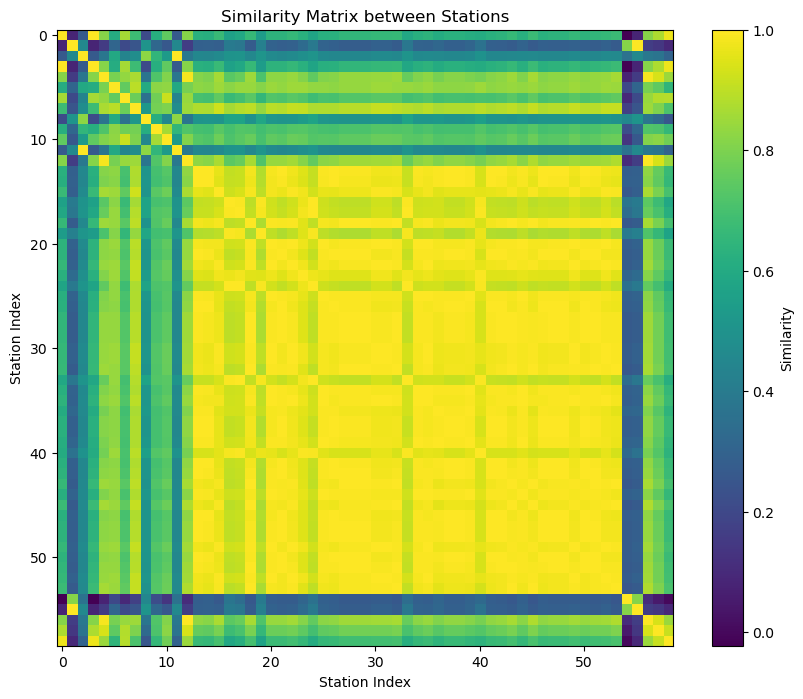

In [189]:
import matplotlib.pyplot as plt

# Initialize an empty list to store u10 values for each station
u10_values = []

# Loop through station_data and extract u10 values from each station
for station in station_data:
    u10_values.append(station.u10)

# Compute similarity matrix using vectorized operations
similarity_matrix = np.corrcoef(u10_values)

# Visualize the similarity matrix
plt.figure(figsize=(10, 8))
plt.imshow(similarity_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Similarity')
plt.title('Similarity Matrix between Stations')
plt.xlabel('Station Index')
plt.ylabel('Station Index')
plt.show()

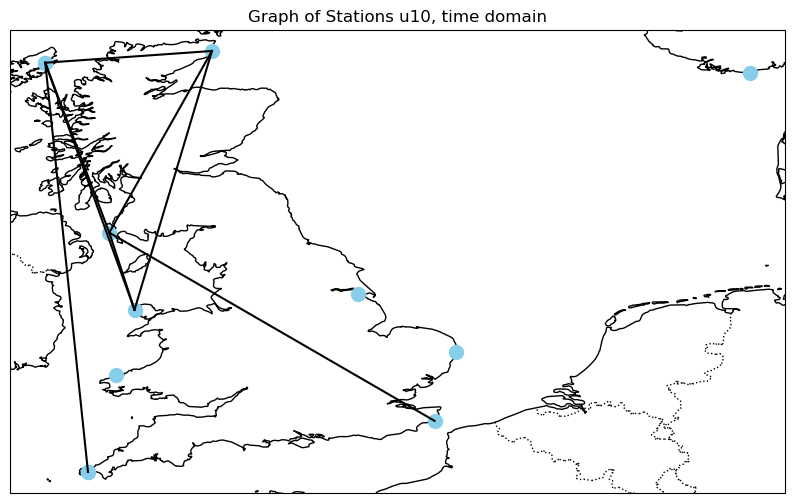

In [197]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import networkx as nx
import cartopy

def plot_station_graph(station_data, station_coordinates, variable, threshold=0.5):
    # Initialize an empty list to store variable values for each station
    variable_values = []

    # Loop through station_data and extract variable values from each station
    for station in station_data:
        variable_values.append(getattr(station, variable))

    # Compute similarity matrix using vectorized operations
    similarity_matrix = np.corrcoef(variable_values)

    # Construct the graph based on the similarity matrix and threshold
    G = nx.Graph()
    num_stations = similarity_matrix.shape[0]

    # Add nodes to the graph
    G.add_nodes_from(range(num_stations))

    # Add edges to the graph based on the similarity matrix and threshold
    for i in range(num_stations):
        for j in range(i + 1, num_stations):
            if similarity_matrix[i, j] > threshold:
                G.add_edge(i, j)

    # Create a Cartopy PlateCarree projection
    projection = ccrs.PlateCarree()

    # Visualize the map
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=projection)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, linestyle=':', linewidth=1)

    for node in G.nodes():
        if node in station_coordinates:
            lat, lon = station_coordinates[node]['latitude'], station_coordinates[node]['longitude']
            ax.plot(lon, lat, 'o', markersize=10, color='skyblue', transform=projection)

    # Plot connections between nodes
    for edge in G.edges():
        node1, node2 = edge
        if node1 in station_coordinates and node2 in station_coordinates:
            lat1, lon1 = station_coordinates[node1]['latitude'], station_coordinates[node1]['longitude']
            lat2, lon2 = station_coordinates[node2]['latitude'], station_coordinates[node2]['longitude']
            ax.plot([lon1, lon2], [lat1, lat2], color='black', transform=projection)

    # Set title and labels
    plt.title(f"Graph of Stations {variable}, time domain")
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show the plot
    plt.show()

# Example usage:
plot_station_graph(station_data, station_coordinates, 'u10', threshold=0.9)


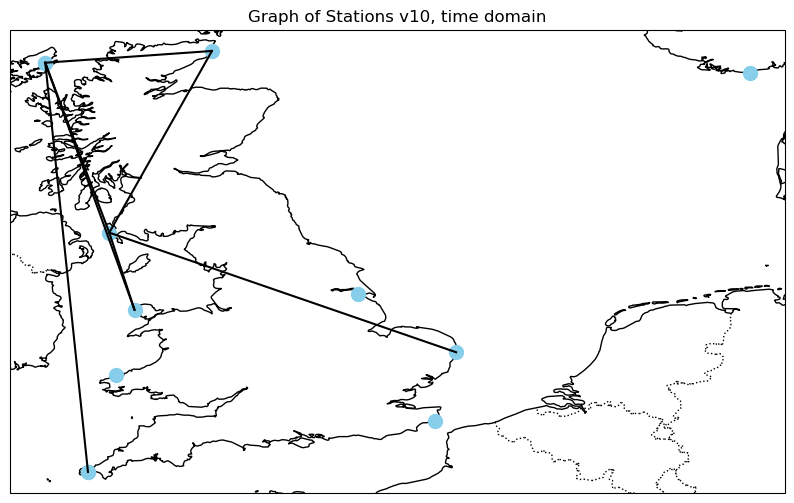

In [198]:
# Example usage:
plot_station_graph(station_data, station_coordinates, 'v10', threshold=0.9)

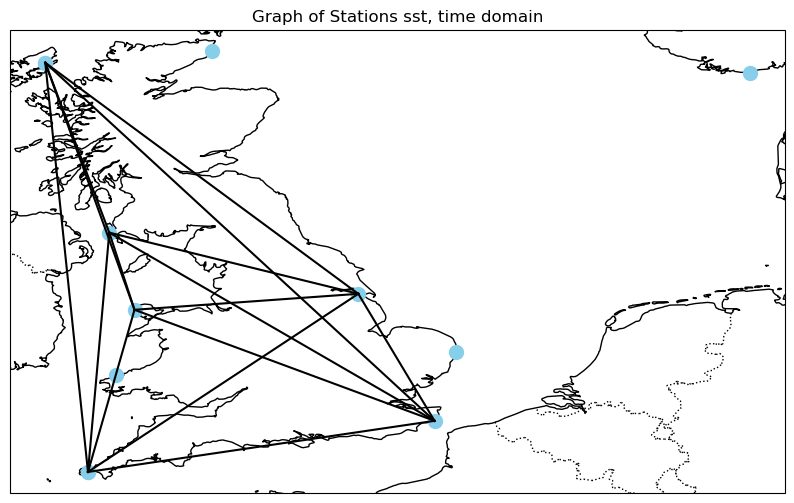

In [204]:
# Example usage:
plot_station_graph(station_data, station_coordinates, 'sst', threshold=0.5)

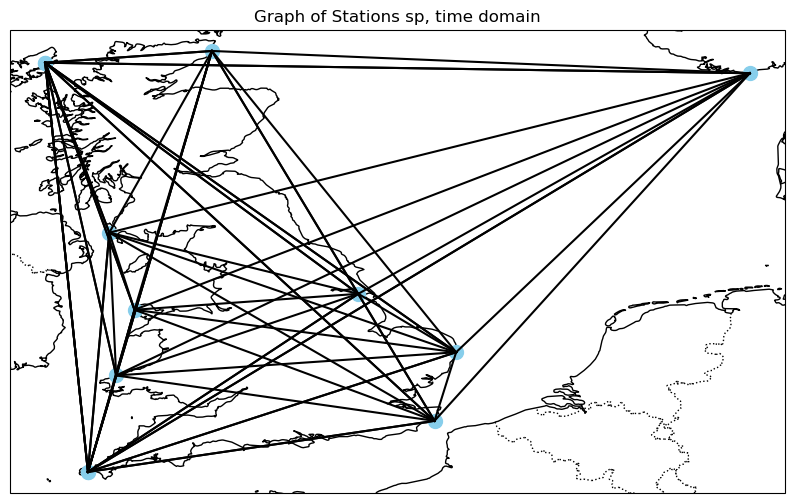

In [209]:
# Example usage:
plot_station_graph(station_data, station_coordinates, 'sp', threshold=0.001)

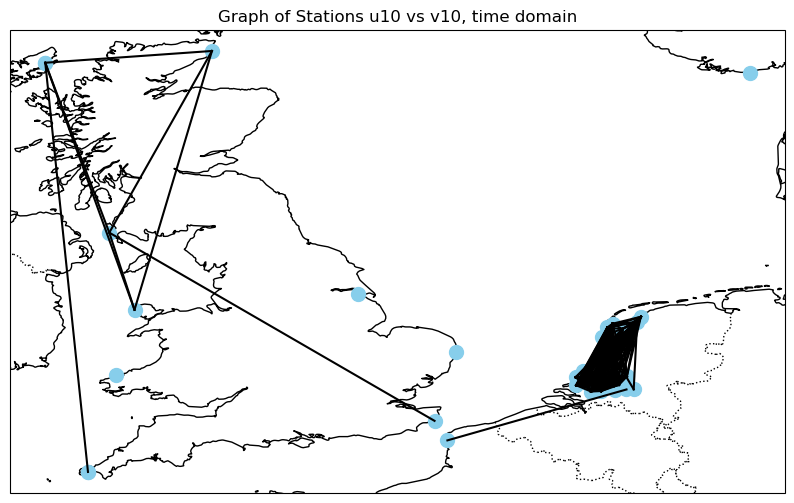

In [229]:
import numpy as np

def plot_station_graph_2vars(station_data, station_coordinates, variable1, variable2, threshold=0.5):
    # Initialize empty lists to store variable values for each station
    variable1_values = []
    variable2_values = []

    # Loop through station_data and extract variable values from each station
    for station in station_data:
        variable1_values.append(getattr(station, variable1))
        variable2_values.append(getattr(station, variable2))

    # Compute correlation matrix between the two variables
    correlation_matrix = np.corrcoef(variable1_values, variable2_values)

    # Construct the graph based on the correlation matrix and threshold
    G = nx.Graph()
    num_stations = correlation_matrix.shape[0]

    # Add nodes to the graph
    G.add_nodes_from(range(num_stations))

    # Add edges to the graph based on the correlation matrix and threshold
    for i in range(num_stations):
        for j in range(i + 1, num_stations):
            if abs(correlation_matrix[i, j]) > threshold:  # Use absolute value for correlation
                G.add_edge(i, j)

    # Create a Cartopy PlateCarree projection
    projection = ccrs.PlateCarree()

    # Visualize the map
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=projection)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, linestyle=':', linewidth=1)

    for node in G.nodes():
        if node in station_coordinates:
            lat, lon = station_coordinates[node]['latitude'], station_coordinates[node]['longitude']
            ax.plot(lon, lat, 'o', markersize=10, color='skyblue', transform=projection)

    # Plot connections between nodes
    for edge in G.edges():
        node1, node2 = edge
        if node1 in station_coordinates and node2 in station_coordinates:
            lat1, lon1 = station_coordinates[node1]['latitude'], station_coordinates[node1]['longitude']
            lat2, lon2 = station_coordinates[node2]['latitude'], station_coordinates[node2]['longitude']
            ax.plot([lon1, lon2], [lat1, lat2], color='black', transform=projection)

    # Set title and labels
    plt.title(f"Graph of Stations {variable1} vs {variable2}, time domain")
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show the plot
    plt.show()

# Example usage:
plot_station_graph_2vars(station_data, station_coordinates, 'u10', 'v10', threshold=0.9)

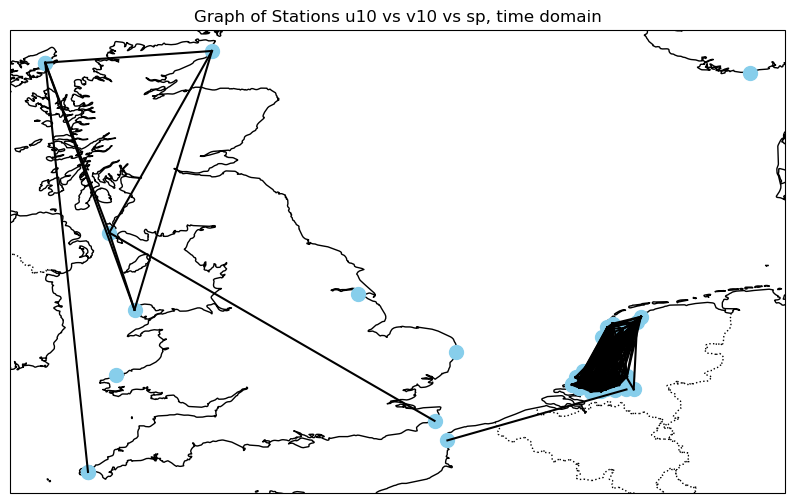

In [230]:
import numpy as np

def plot_station_graph_multi_vars(station_data, station_coordinates, variables, threshold=0.5):
    # Initialize empty lists to store variable values for each station
    variable_values = {var: [] for var in variables}

    # Loop through station_data and extract variable values from each station
    for station in station_data:
        for var in variables:
            variable_values[var].append(getattr(station, var))

    # Compute correlation matrix between the variables
    correlation_matrix = np.corrcoef(np.vstack([variable_values[var] for var in variables]))

    # Construct the graph based on the correlation matrix and threshold
    G = nx.Graph()
    num_variables = correlation_matrix.shape[0]

    # Add nodes to the graph
    G.add_nodes_from(range(num_variables))

    # Add edges to the graph based on the correlation matrix and threshold
    for i in range(num_variables):
        for j in range(i + 1, num_variables):
            if abs(correlation_matrix[i, j]) > threshold:  # Use absolute value for correlation
                G.add_edge(i, j)

    # Create a Cartopy PlateCarree projection
    projection = ccrs.PlateCarree()

    # Visualize the map
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=projection)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, linestyle=':', linewidth=1)

    for node in G.nodes():
        if node in station_coordinates:
            lat, lon = station_coordinates[node]['latitude'], station_coordinates[node]['longitude']
            ax.plot(lon, lat, 'o', markersize=10, color='skyblue', transform=projection)

    # Plot connections between nodes
    for edge in G.edges():
        node1, node2 = edge
        if node1 in station_coordinates and node2 in station_coordinates:
            lat1, lon1 = station_coordinates[node1]['latitude'], station_coordinates[node1]['longitude']
            lat2, lon2 = station_coordinates[node2]['latitude'], station_coordinates[node2]['longitude']
            ax.plot([lon1, lon2], [lat1, lat2], color='black', transform=projection)

    # Set title and labels
    plt.title(f"Graph of Stations {' vs '.join(variables)}, time domain")
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show the plot
    plt.show()

# Example usage:
plot_station_graph_multi_vars(station_data, station_coordinates, ['u10', 'v10', 'sp'], threshold=0.9)

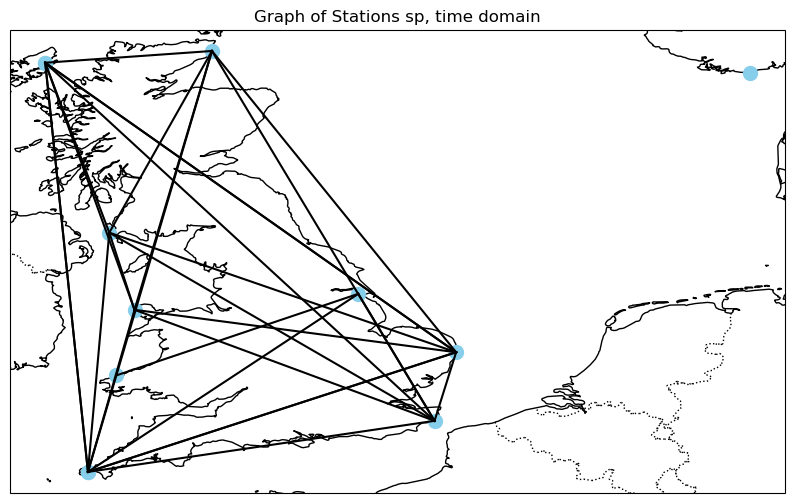

In [231]:
# Example usage:
plot_station_graph_multi_vars(station_data, station_coordinates, ['sp'], threshold=0.9)

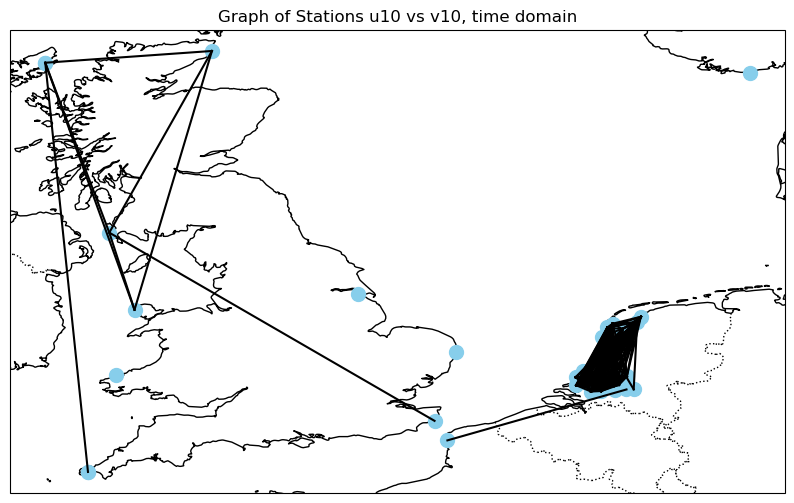

In [235]:
# Example usage:
plot_station_graph_multi_vars(station_data, station_coordinates, ['u10', 'v10'], threshold=0.9)

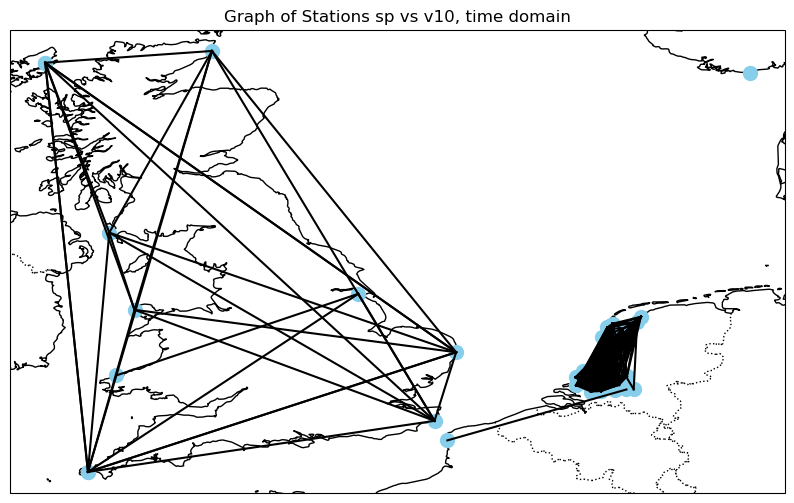

In [236]:
# Example usage:
plot_station_graph_multi_vars(station_data, station_coordinates, ['sp', 'v10'], threshold=0.9)

In [241]:
# List out all variables in station_data
variable_names = list(station_data[0].variables)
print(variable_names)

['longitude', 'latitude', 'time', 'u10', 'v10', 'mdts', 'mpts', 'mwd', 'mwp', 'sst', 'shts', 'shww', 'sp']


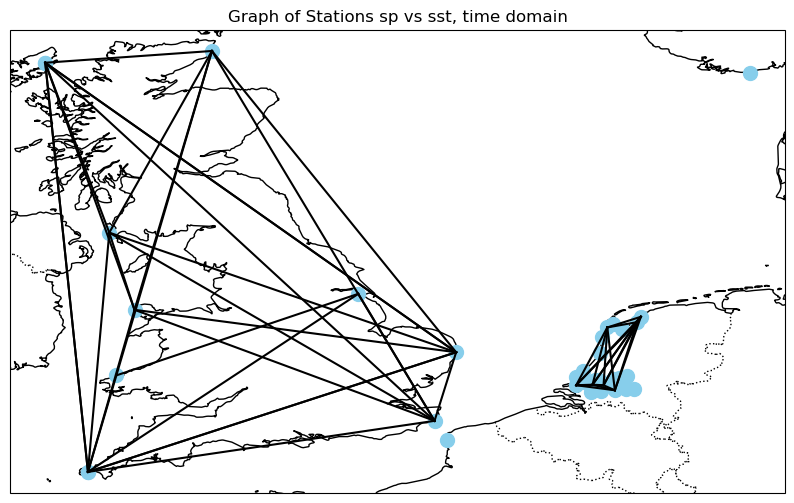

In [249]:
# Example usage:
plot_station_graph_multi_vars(station_data, station_coordinates, ['sp','sst'], threshold=0.9)

# add ESL data

59

In [275]:
len(getattr(station, 'u10'))

17520

In [278]:
len(getattr(sea_level, 'q_sea_level'))

17544

In [277]:
# Initialize an empty list to store variable values for each station
variable_values = []

    # Loop through station_data and extract variable values from each station
for i in range(2):
    station = station_data[i]
    variable_values.append(getattr(station, 'u10'))

    sea_level = GESLA_ds.sel(station = i)
    getattr(sea_level, 'q_sea_level')

variable_values

[<xarray.DataArray 'u10' (time: 17520)>
 array([-0.32191896, -0.06505394,  1.0285221 , ...,  4.008792  ,
         4.827235  ,  5.8006067 ], dtype=float32)
 Coordinates:
     longitude  float32 -5.5
     latitude   float32 50.0
   * time       (time) datetime64[ns] 1980-01-01 ... 1981-12-31T23:00:00
 Attributes:
     units:      m s**-1
     long_name:  10 metre U wind component,
 <xarray.DataArray 'u10' (time: 17520)>
 array([-5.3254666, -5.3611846, -5.2798696, ...,  9.527808 ,  9.746006 ,
        10.184023 ], dtype=float32)
 Coordinates:
     longitude  float32 7.5
     latitude   float32 58.0
   * time       (time) datetime64[ns] 1980-01-01 ... 1981-12-31T23:00:00
 Attributes:
     units:      m s**-1
     long_name:  10 metre U wind component]

In [ ]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import networkx as nx
import cartopy

def plot_station_graph(station_data, station_coordinates, variable, threshold=0.5):
    # Initialize an empty list to store variable values for each station
    variable_values = []

    # Loop through station_data and extract variable values from each station
    for station in station_data:
        variable_values.append(getattr(station, variable))

    # Compute similarity matrix using vectorized operations
    similarity_matrix = np.corrcoef(variable_values)

    # Construct the graph based on the similarity matrix and threshold
    G = nx.Graph()
    num_stations = similarity_matrix.shape[0]

    # Add nodes to the graph
    G.add_nodes_from(range(num_stations))

    # Add edges to the graph based on the similarity matrix and threshold
    for i in range(num_stations):
        for j in range(i + 1, num_stations):
            if similarity_matrix[i, j] > threshold:
                G.add_edge(i, j)

    # Create a Cartopy PlateCarree projection
    projection = ccrs.PlateCarree()

    # Visualize the map
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=projection)

    # Add coastlines and borders
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS, linestyle=':', linewidth=1)

    for node in G.nodes():
        if node in station_coordinates:
            lat, lon = station_coordinates[node]['latitude'], station_coordinates[node]['longitude']
            ax.plot(lon, lat, 'o', markersize=10, color='skyblue', transform=projection)

    # Plot connections between nodes
    for edge in G.edges():
        node1, node2 = edge
        if node1 in station_coordinates and node2 in station_coordinates:
            lat1, lon1 = station_coordinates[node1]['latitude'], station_coordinates[node1]['longitude']
            lat2, lon2 = station_coordinates[node2]['latitude'], station_coordinates[node2]['longitude']
            ax.plot([lon1, lon2], [lat1, lat2], color='black', transform=projection)

    # Set title and labels
    plt.title(f"Graph of Stations {variable}, time domain")
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show the plot
    plt.show()

# Example usage:
plot_station_graph(station_data, station_coordinates, 'u10', threshold=0.9)
